# **Explainable AI - XAI use of EBM, LIME and SHAP**


## Breast Cancer Wisconsin (Diagnostic) Dataset



In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import SelectFromModel
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

### Loading data from CSV

In [ ]:
# Load dataset
url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data'
names = ['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst']
dataframe = pd.read_csv(url, names=names)

In [ ]:
dataframe.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


# EDA for Breast Cancer Wisconsin Dataset

### Pre-Processing

In [ ]:
# Handle missing values
dataframe.isna().sum()


id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave_points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave_points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave_points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

Dataset is clean. There is no missing values therefore, no further processing required to remove or imputate missing data

In [ ]:
#for column  in dataframe.iloc[:, 1:].columns:
  #print(dataframe[column].unique())

In [ ]:
# Handle data types
dataframe.dtypes

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave_points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave_points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

In [ ]:
# Convert Boolean columns (e.g.: Yes/No) from Object type to Boolean

dataframe['diagnosis'] = dataframe['diagnosis'].map({'M':1, 'B':0})
dataframe = dataframe.drop('id', axis=1)
dataframe.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
# get the dimenions of data
dataframe.shape

(569, 31)

In [ ]:
# Target Variable:
dataframe.diagnosis.value_counts()

diagnosis
0    357
1    212
Name: count, dtype: int64

In [ ]:
# statistics of our data:
dataframe.describe().T

,count,mean,std,min,25%,50%,75%,max
diagnosis,569.0,0.372583,0.483918,0.000000,0.000000,0.000000,1.000000,1.00000
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave_points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400


In [ ]:
columns = list(dataframe.columns)

In [ ]:
numerical_features, categorical_features = columns[1:], columns[0]
print("Numerical Features: #", len(numerical_features),'-', numerical_features)
print("Categorical Features:#", len(categorical_features),'-', categorical_features)

Numerical Features: # 30 - ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst']
Categorical Features:# 9 - diagnosis


## Univariate Analysis for Numerical Features

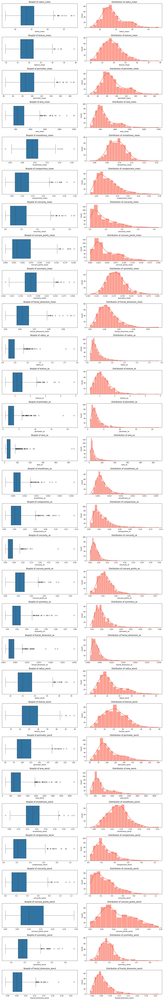

In [ ]:
# Set up the matplotlib figure
fig, axes = plt.subplots(nrows=len(numerical_features), ncols=2, figsize=(15, 3*len(numerical_features)))
plt.subplots_adjust(hspace=0.5)

# Iterate through numerical features
for i, feature in enumerate(numerical_features):
    sns.set_theme(style="whitegrid")
    # Boxplot
    sns.boxplot(x=dataframe[feature], ax=axes[i, 0])
    axes[i, 0].set_title(f'Boxplot of {feature}')
    axes[i, 0].set_xlabel(feature)

    # Distribution plot
    sns.histplot(dataframe[feature], kde=True, ax=axes[i, 1], color='#ff4125')
    axes[i, 1].set_title(f'Distribution of {feature}')
    axes[i, 1].set_xlabel(feature)

# Show plots
plt.tight_layout()
plt.show()

Most of the numeric features got outliers. Total records in the dataset is 569, which is really small hence we can’t remove these and further such decision should be back by domain knowledge which is lacking with me. Hence it is better to select ML model which can handle outliers like Randon Forest.

In [ ]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(dataframe.drop('diagnosis', axis=1))
#dataframe = scaler.fit_transform(dataframe)

In [ ]:
df = pd.DataFrame(df_scaled)
df.columns = numerical_features
df.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


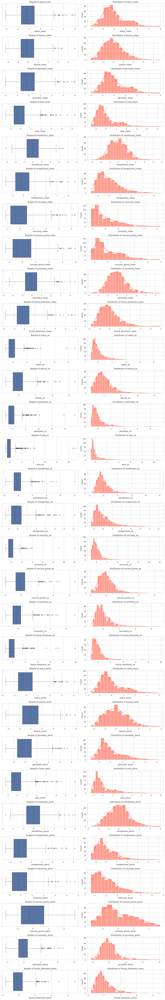

In [ ]:
# Set up the matplotlib figure
fig, axes = plt.subplots(nrows=len(numerical_features), ncols=2, figsize=(15, 3*len(numerical_features)))
plt.subplots_adjust(hspace=0.5)

# Iterate through numerical features
for i, feature in enumerate(numerical_features):
    sns.set_theme(style="whitegrid")
    # Boxplot
    sns.boxplot(x=df[feature], ax=axes[i, 0])
    axes[i, 0].set_title(f'Boxplot of {feature}')
    axes[i, 0].set_xlabel(feature)

    # Distribution plot
    sns.histplot(df[feature], kde=True, ax=axes[i, 1], color='#ff4125')
    axes[i, 1].set_title(f'Distribution of {feature}')
    axes[i, 1].set_xlabel(feature)

# Show plots
plt.tight_layout()
plt.show()

## Bivariate / Multivariate Analysis of Numerical Features

In [ ]:
df['diagnosis'] = dataframe['diagnosis']
corr = df.corr().round(2)


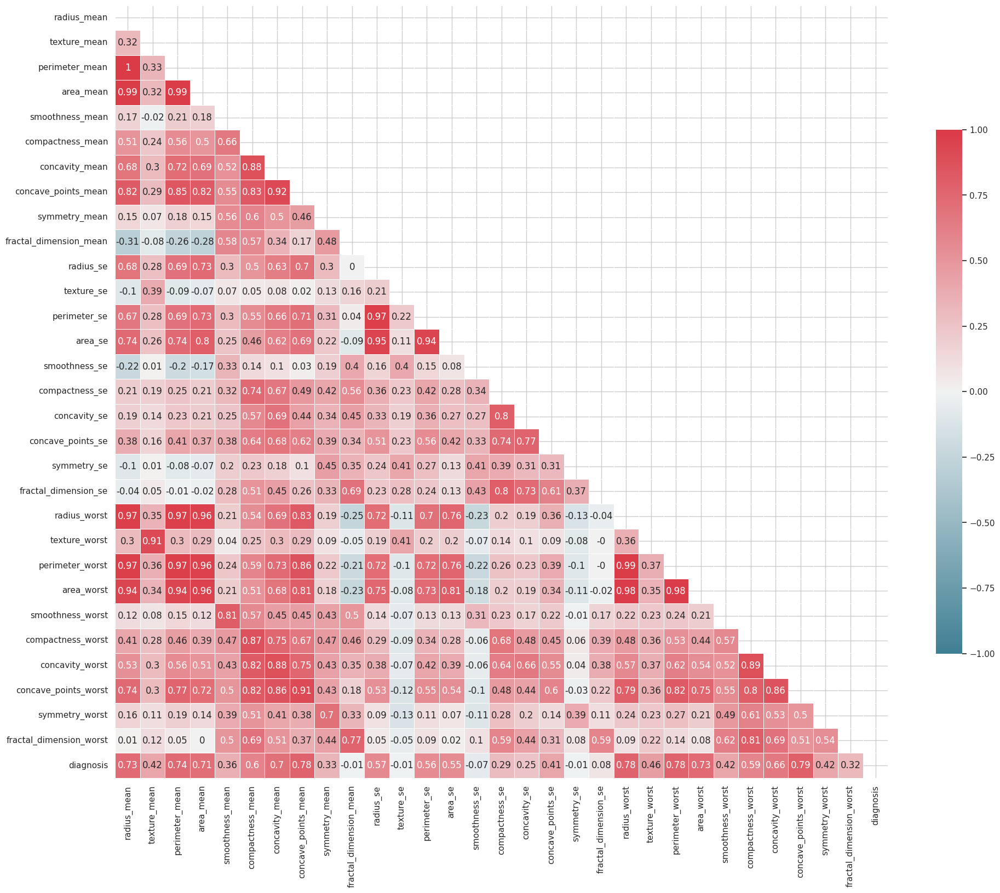

In [ ]:
# Define custom colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

mask = np.zeros_like(corr, dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
plt.tight_layout()

In [ ]:
#From the correlation matrix we got to knwo that these columns are highly correlated with radius_mean, perimeter, area columns.
# So we are dropping these columns:

# first, drop all "worst" columns
cols = ['radius_worst',
        'texture_worst',
        'perimeter_worst',
        'area_worst',
        'smoothness_worst',
        'compactness_worst',
        'concavity_worst',
        'concave_points_worst',
        'symmetry_worst',
        'fractal_dimension_worst']
df = df.drop(cols, axis=1)

# then, drop all columns related to the "perimeter" and "area" attributes
cols = ['perimeter_mean',
        'perimeter_se',
        'area_mean',
        'area_se']
df = df.drop(cols, axis=1)

# lastly, drop all columns related to the "concavity" and "concave points" attributes
cols = ['concavity_mean',
        'concavity_se',
        'concave_points_mean',
        'concave_points_se']
df = df.drop(cols, axis=1)

# verify remaining columns
df.columns

Index(['radius_mean', 'texture_mean', 'smoothness_mean', 'compactness_mean',
       'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
       'smoothness_se', 'compactness_se', 'symmetry_se',
       'fractal_dimension_se', 'diagnosis'],
      dtype='object')

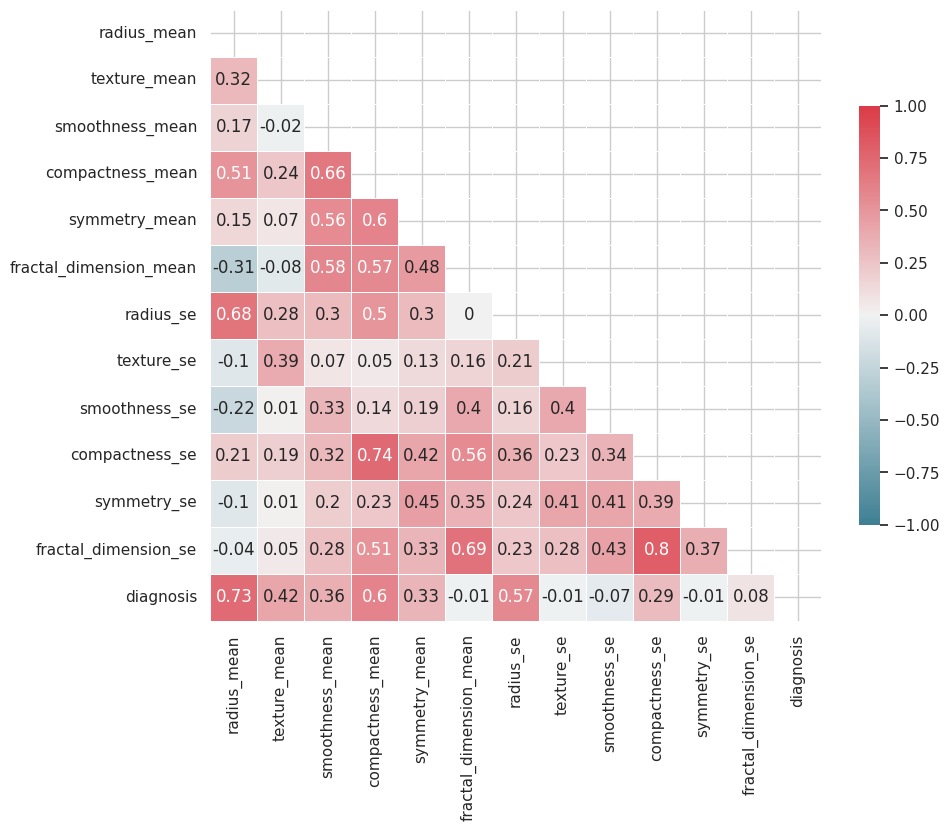

In [ ]:
# Draw the heatmap again, with the new correlation matrix
corr = df.corr().round(2)

# Define custom colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

mask = np.zeros_like(corr, dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
plt.tight_layout()

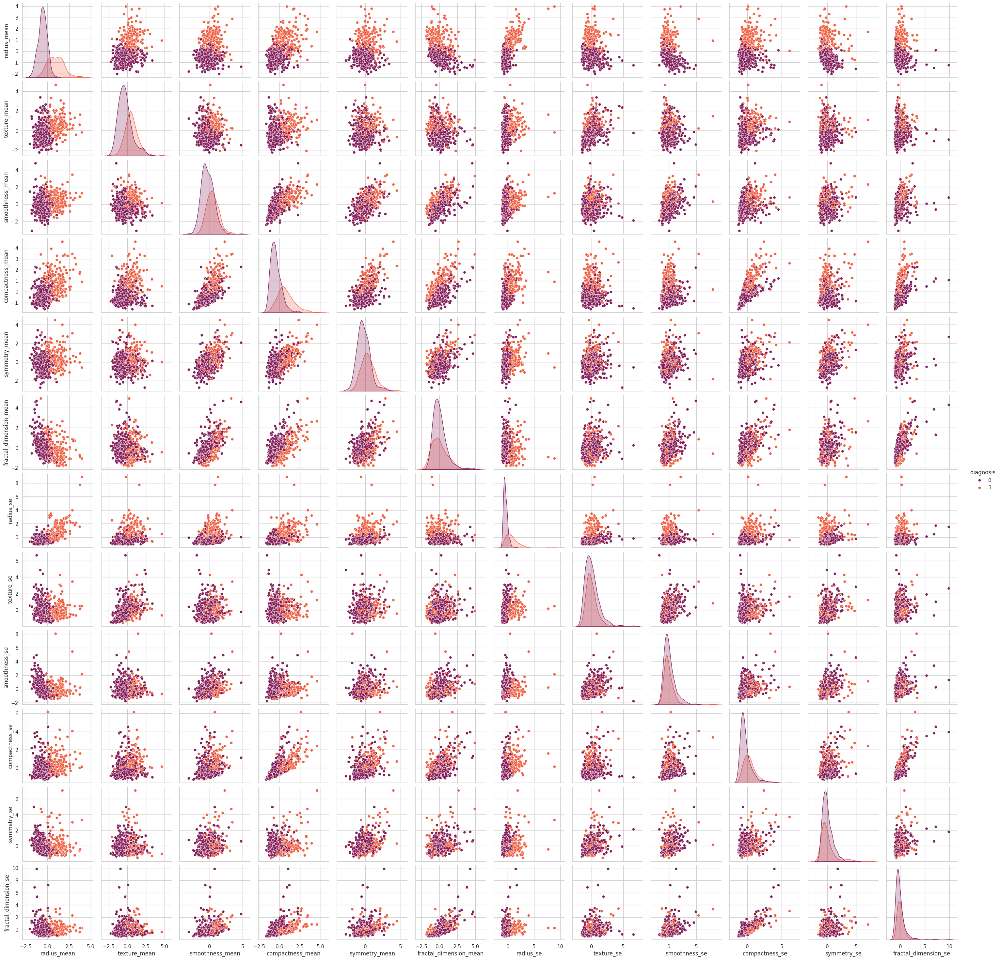

In [ ]:
#generate a scatter plot with the following columns:

sns.pairplot(data=df, hue="diagnosis", palette='rocket')

In [ ]:
df = df.drop('diagnosis', axis=1)

### Split Train and Test set


In [ ]:
# Split the data into features and target
X = df
y = dataframe['diagnosis']

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=0)

# Glassbox Model - Explainable Boosting Machine - EBM

In [ ]:
!pip install interpret

# Clear the output after installation
from IPython.display import clear_output
clear_output()

# Print a confirmation message
print("Packages installed successfully.")


Packages installed successfully.


In [ ]:
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show

In [ ]:
# Train Explainable Boosting Machine (EBM) model
ebm = ExplainableBoostingClassifier(random_state=0)
ebm.fit(X_train, y_train)

# Evaluate the model
y_pred = ebm.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

Accuracy: 0.9122807017543859
F1 Score: 0.888888888888889


In [ ]:
# Interpret the model globally
ebm_global = ebm.explain_global()
show(ebm_global)

In [ ]:
# Interpret the model locally on the last 50 records of the test set
X_test_last_50 = X_test[-50:]
y_test_last_50 = y_test[-50:]
ebm_local = ebm.explain_local(X_test_last_50, y_test_last_50)
show(ebm_local)

# Random Forest classifier Implementation

Following parameters will be used to select optimal configuration for Random forest.

**n_estimators:** This parameter defines the number of trees in the forest. A larger number of trees can result in a more accurate model, but also increases the computational time.

**max_depth**: This parameter sets the maximum depth of each tree in the forest. A deeper tree can capture more complex relationships in the data, but also increases the risk of overfitting.

**min_samples_split**: This parameter sets the minimum number of samples required to split an internal node in a tree. A higher value for this parameter results in more conservative trees, which can help to reduce overfitting.



Mean test score: 91.65% for hyperparameters: {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 100}
Mean test score: 91.87% for hyperparameters: {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 200}
Mean test score: 92.31% for hyperparameters: {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 300}
Mean test score: 91.65% for hyperparameters: {'max_depth': 3, 'min_samples_split': 4, 'n_estimators': 100}
Mean test score: 91.87% for hyperparameters: {'max_depth': 3, 'min_samples_split': 4, 'n_estimators': 200}
Mean test score: 92.31% for hyperparameters: {'max_depth': 3, 'min_samples_split': 4, 'n_estimators': 300}
Mean test score: 92.31% for hyperparameters: {'max_depth': 3, 'min_samples_split': 6, 'n_estimators': 100}
Mean test score: 91.65% for hyperparameters: {'max_depth': 3, 'min_samples_split': 6, 'n_estimators': 200}
Mean test score: 92.75% for hyperparameters: {'max_depth': 3, 'min_samples_split': 6, 'n_estimators': 300}
Mean test score: 93.63% for hyperpara

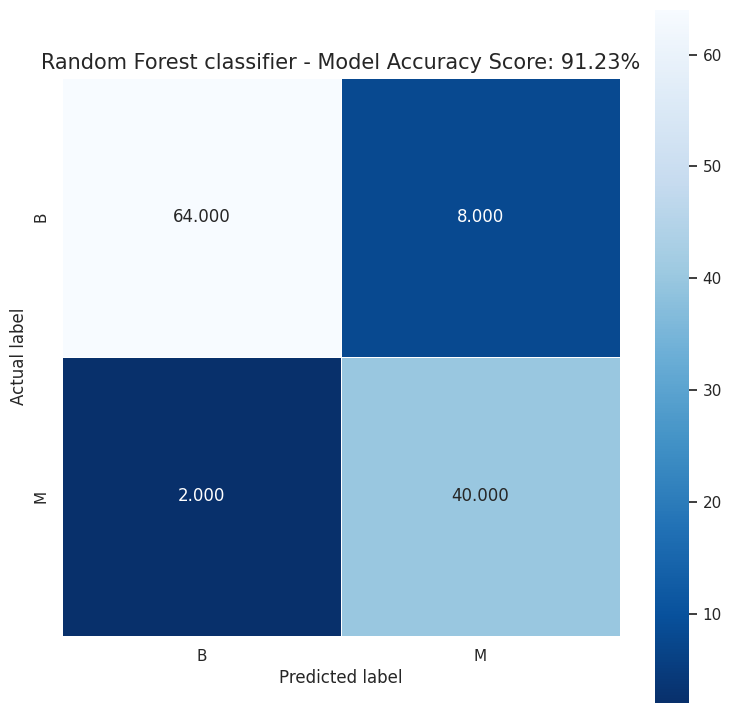

In [ ]:
from sklearn.pipeline import Pipeline

# Define the hyperparameters to be tuned
param_grid = {'n_estimators': [100, 200, 300],
              'max_depth': [3, 4, 5],
              'min_samples_split': [2, 4, 6]}
class_names = ['B','M']

# Train a Random Forest classifier with GridSearchCV
rfc = RandomForestClassifier()
grid_search = GridSearchCV(rfc, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Get the results of the GridSearchCV
results = grid_search.cv_results_

# Print the mean test scores for each hyperparameter combination
for mean_test_score, params in zip(results['mean_test_score'], results['params']):
    print("Mean test score: {:.2f}% for hyperparameters: {}".format(mean_test_score * 100, params))


# Print the best parameters and the best score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Predict the target values for the test data
rfc = RandomForestClassifier(**best_params)
blackbox_model = Pipeline([('rfc', rfc)])
blackbox_model.fit(X_train, y_train)
#rfc.fit(X_train, y_train)

# Make predictions on the testing data
#y_pred = rfc.predict(X_test)
y_pred = blackbox_model.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r', yticklabels=class_names, xticklabels=class_names)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = f'Random Forest classifier - Model Accuracy Score: {accuracy:.2%}'
plt.title(all_sample_title, size = 15)

print(classification_report(y_test, y_pred,labels = [0, 1], target_names=class_names))

print("Best hyperparameters", best_params)
print("Accuracy: {:.2%}".format(accuracy))
print("Precision: {:.2%}".format(precision))
print("Recall: {:.2%}".format(recall))
print("F1-score:{:.2%}".format(f1))

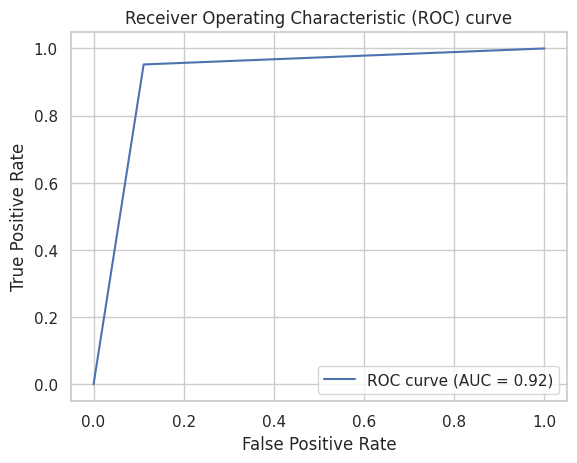

In [ ]:
# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred)

# Calculate the false positive rate and true positive rate for different thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (AUC = {:.2f})'.format(roc_auc))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) curve')
plt.legend(loc='best')
plt.show()

# LIME – Local Interpretable Model-Agnostic Explanations

In [ ]:
!pip install lime
clear_output()

# Print a confirmation message
print("Packages installed successfully.")

Packages installed successfully.


In [ ]:
from interpret.blackbox import LimeTabular
from interpret import show


# Define predictors and target
predictors = ['radius_mean', 'texture_mean', 'smoothness_mean', 'compactness_mean',
              'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se',
              'smoothness_se', 'compactness_se', 'symmetry_se', 'fractal_dimension_se']
target = 'diagnosis'

In [ ]:
import warnings
#Suppress specific warnings
warnings.filterwarnings("ignore", message="X does not have valid feature names")

# Use LIME for local interpretation
lime = LimeTabular( blackbox_model, data=X_train, random_state=1)

# Interpret the model locally on the last 50 records of the test set
X_test_last_50 = X_test[-50:]
y_test_last_50 = y_test[-50:]
lime_local = lime.explain_local(X_test_last_50.values, y_test_last_50.values, name='LIME')

# Show the interpretation
show(lime_local)

In [ ]:
# Show weights for the first explained instance
exp = lime.explain_local(X_test_last_50.values[:1], y_test_last_50.values[:1])
# Extract and print the explanation weights
weights = exp.data(0)  # Get the explanation for the first instance

print("Feature contributions for the first explained instance:")
for feature, weight in zip(weights['names'], weights['scores']):
    print(f"Feature: {feature}, Weight: {weight}")

Feature contributions for the first explained instance:
Feature: radius_mean, Weight: 0.3744708782715546
Feature: radius_se, Weight: 0.16696578453257913
Feature: compactness_mean, Weight: -0.10498740046866162
Feature: texture_mean, Weight: 0.09005655763667593
Feature: smoothness_mean, Weight: -0.07743265014728411
Feature: compactness_se, Weight: 0.02460141899503019
Feature: fractal_dimension_mean, Weight: 0.023732476698206696
Feature: smoothness_se, Weight: 0.016858228311188578
Feature: fractal_dimension_se, Weight: -0.011855379119495206
Feature: symmetry_se, Weight: -0.010591106685821642


# SHAP – Shapley Additive explanation

In [ ]:
!pip install shap
clear_output()

# Print a confirmation message
print("Packages installed successfully.")

Packages installed successfully.


In [ ]:
import shap

In [ ]:
# Use SHAP for local and global interpretation
explainer = shap.TreeExplainer(blackbox_model.named_steps['rfc'])

In [ ]:
X_choosen_instance = X_test[-2:-1:]
y_choosen_instance = y_test[-2:-1:]

In [ ]:
X_choosen_instance, y_choosen_instance

(    radius_mean  texture_mean  smoothness_mean  compactness_mean  \
 23     1.997389      0.872732        -0.148044         -0.040575   
 
     symmetry_mean  fractal_dimension_mean  radius_se  texture_se  \
 23      -0.155598                 -1.4201    1.03414   -0.163025   
 
     smoothness_se  compactness_se  symmetry_se  fractal_dimension_se  
 23      -0.771024       -0.720312    -1.175951             -0.683842  ,
 23    1
 Name: diagnosis, dtype: int64)

In [ ]:
shap_values = explainer.shap_values(X_choosen_instance,  approximate=True)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[0,:,1],X_choosen_instance)

In [ ]:
X_choosen_instance = X_test[-1:]
y_choosen_instance = y_test[-1:]

In [ ]:
shap_values = explainer.shap_values(X_choosen_instance,  approximate=True)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[0,:,1],X_choosen_instance)

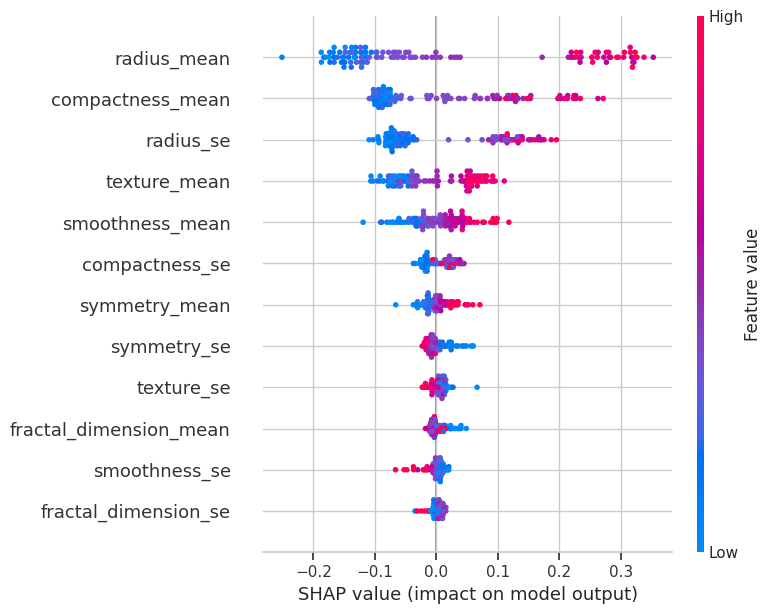

In [ ]:
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values[:,:,1], X_test)

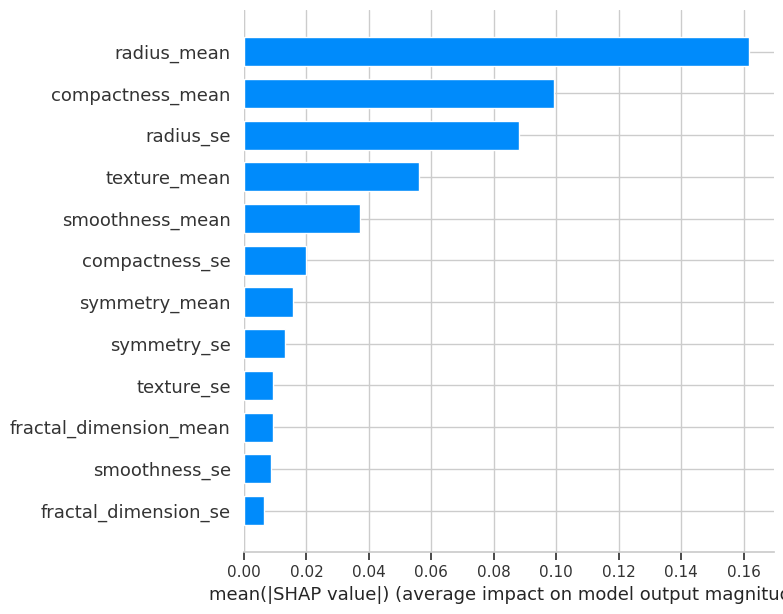

In [ ]:
shap.summary_plot(shap_values[:,:,1], X_test, plot_type='bar', feature_names=predictors)

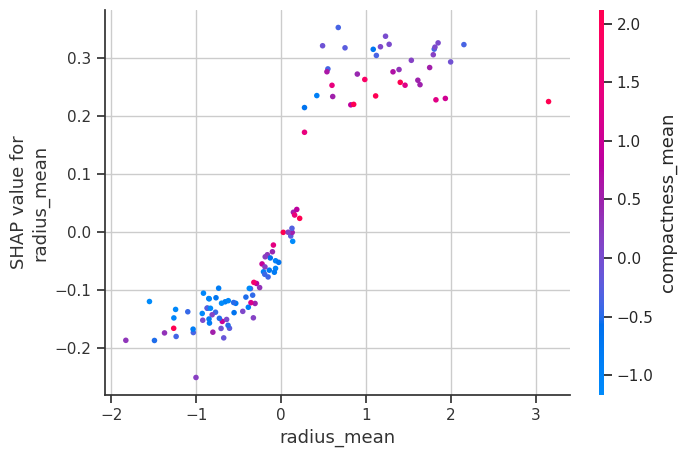

In [ ]:
shap.dependence_plot("radius_mean", shap_values[:,:,1], X_test, feature_names=predictors)